In [111]:
import json 
with open('iranianNamesDataset.json', 'r', encoding="utf-8") as f:
    word_dict = json.load(f)
words = []
for name in word_dict['RECORDS']:
    words.append(name['Names'])
words

['ابوالحسن',
 'احمد',
 'احمدرضا',
 'آذر',
 'آرش',
 'آ رمان',
 'آ ریا',
 'ا زاده',
 'آ زاد',
 'ا سماعیل',
 'اشرف',
 'ا صغر',
 'ا عظم',
 'افسانه',
 'ا فشین',
 'ا قدس',
 'ا کبر',
 'آ کو',
 'آ لان',
 'ا لشان',
 'ا لنا ز',
 'ا لناز',
 'ا لها م',
 'ا لهه',
 'ا م البنین',
 'ا میر',
 'ا میر حسین',
 'ا میر ر ضا',
 'آ مینه',
 'آ ناهید',
 'ا نیس',
 'آوات',
 'آ ی تک',
 'ادریس',
 'اسدالله',
 'اصغر',
 'اکبر',
 'الله بردی',
 'الهام',
 'ام لیلا',
 'امید',
 'ایرج',
 'ابا',
 'ابا بکر',
 'ابا ذر',
 'ابا سلت',
 'ابا صلت',
 'ابابکر',
 'ابات',
 'آباد',
 'آبادان',
 'ابادر',
 'اباذر',
 'اباذر علی',
 'ابراهیم',
 'اباز',
 'ابازر',
 'اباس',
 'اباسط',
 'اباسعد',
 'اباسل',
 'اباسلت',
 'اباسلط',
 'اباسلک',
 'اباصت',
 'اباصد',
 'اباصل',
 'اباصلت',
 'اباصلط',
 'ابالفتح',
 'ابالفضل',
 'آبامه',
 'آبان',
 'آبان دخت',
 'اباهیم',
 'آبت اله',
 'ابتاج',
 'ابتسام',
 'ابتسلم',
 'ابتصام',
 'ابتهاج',
 'ابتین',
 'آبتین آی',
 'آبث',
 'ابجد',
 'ابحش',
 'ابخش',
 'ابدال',
 'ابدالحسن',
 'ابدالرضا',
 'ابدالفضل',
 'ابدالمجید',
 'ابدالو

In [3]:
b = {}
for w in words:
    chs = ['<S>'] + list(w) + ['<E>']
    for ch1, ch2 in zip(chs, chs[1:]):
        bigram = (ch1, ch2)
        b[bigram] = b.get(bigram, 0) + 1
        

In [4]:
sorted(b.items(), key = lambda kv: -kv[1])

[(('ه', '<E>'), 3168),
 (('<S>', 'م'), 3151),
 (('ی', '<E>'), 3028),
 (('ا', 'ل'), 2905),
 (('ن', '<E>'), 2502),
 (('ا', 'ن'), 2458),
 (('<S>', 'ا'), 2298),
 (('ل', 'ی'), 2240),
 ((' ', 'ا'), 1733),
 (('<S>', 'ع'), 1728),
 (('ا', '<E>'), 1677),
 (('ر', '<E>'), 1672),
 (('د', '<E>'), 1644),
 (('ی', 'ر'), 1598),
 (('م', 'ی'), 1558),
 (('ع', 'ل'), 1487),
 (('ر', 'ا'), 1479),
 (('ا', 'م'), 1390),
 (('ح', 'م'), 1389),
 (('ی', 'ن'), 1373),
 (('م', '<E>'), 1224),
 (('م', 'د'), 1208),
 (('ل', 'ه'), 1201),
 (('م', 'ح'), 1193),
 (('ی', ' '), 1179),
 (('ب', 'ی'), 1140),
 (('<S>', 'س'), 1139),
 (('ر', ' '), 1120),
 (('د', 'ی'), 1117),
 (('ا', 'ر'), 1116),
 (('د', 'ا'), 1104),
 (('ل', '<E>'), 1047),
 (('<S>', 'ن'), 1045),
 (('<S>', 'ب'), 1036),
 (('ا', 'د'), 1027),
 (('م', 'ا'), 966),
 ((' ', 'ب'), 939),
 (('د', ' '), 933),
 (('ب', 'ا'), 921),
 (('ر', 'ی'), 914),
 (('ن', 'ا'), 900),
 (('ی', 'ا'), 894),
 (('ع', 'ب'), 826),
 (('<S>', 'ش'), 807),
 (('و', 'ر'), 801),
 (('<S>', 'ف'), 799),
 (('ل', 'ا'),

In [5]:
import torch

In [6]:
N = torch.zeros((38, 38), dtype = torch.int32)

In [7]:
N

tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]], dtype=torch.int32)

In [8]:
chars = sorted(list(set(''.join(words))))
Abakolah = chars[5]
chars = chars[9:-1]
chars.insert(0, Abakolah)
stoi = {s:i+1 for i,s in enumerate(chars)}
stoi['.'] = 0
itos = {i:s for s,i in stoi.items()}

In [9]:
itos

{1: 'آ',
 2: 'ا',
 3: 'ب',
 4: 'ت',
 5: 'ث',
 6: 'ج',
 7: 'ح',
 8: 'خ',
 9: 'د',
 10: 'ذ',
 11: 'ر',
 12: 'ز',
 13: 'س',
 14: 'ش',
 15: 'ص',
 16: 'ض',
 17: 'ط',
 18: 'ظ',
 19: 'ع',
 20: 'غ',
 21: 'ـ',
 22: 'ف',
 23: 'ق',
 24: 'ل',
 25: 'م',
 26: 'ن',
 27: 'ه',
 28: 'و',
 29: 'ى',
 30: 'ً',
 31: 'پ',
 32: 'چ',
 33: 'ژ',
 34: 'ک',
 35: 'گ',
 36: 'ھ',
 37: 'ی',
 0: '.'}

In [77]:
for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        try:
            ix1 = stoi[ch1]
            ix2 = stoi[ch2]
            N[ix1, ix2] += 1
        except:
            pass
N

tensor([[   0,  734, 4596,  ...,  874,    0,  594],
        [   8,    0,    0,  ...,    2,    0,  104],
        [2828,    4,  191,  ...,   45,    0, 1301],
        ...,
        [ 169,    0,  155,  ...,    0,    0,  201],
        [   2,    0,    0,  ...,    0,    0,    0],
        [4730,    0, 1671,  ...,  209,    0,  294]], dtype=torch.int32)

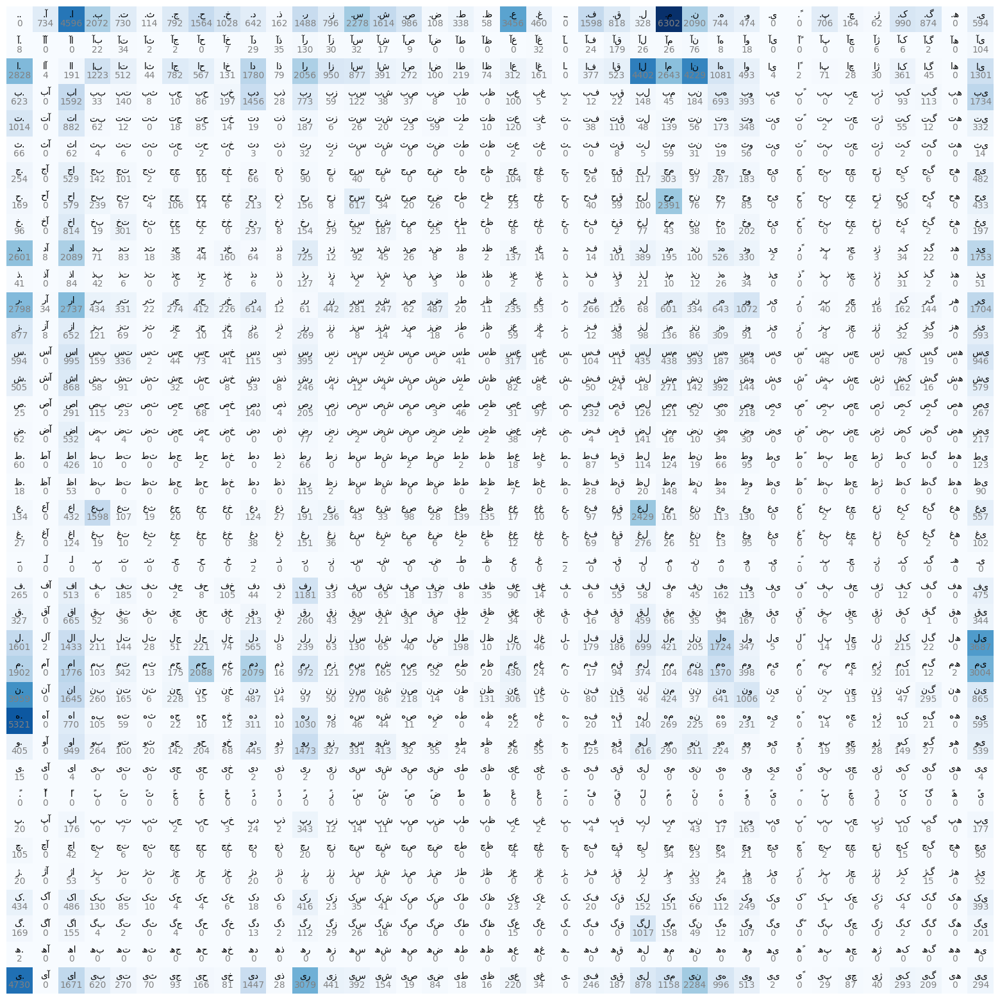

In [78]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(20,20), )
plt.imshow(N, cmap="Blues", )
for i in range(38):
    for j in range(38):
        chstr = itos[i] + itos[j]
        plt.text(j, i, chstr, ha="center", va="bottom", color='black')
        plt.text(j, i, N[i, j].item(), ha="center", va="top", color='gray')
plt.axis('off');

In [12]:
N[0]

tensor([   0,  367, 2298, 1036,  365,   57,  396,  782,  514,  321,   81,  744,
         398, 1139,  807,  493,   54,  169,   29, 1728,  230,    0,  799,  409,
         164, 3151, 1045,  372,  237,    0,    0,  353,   82,   31,  495,  437,
           0,  297], dtype=torch.int32)

In [107]:
probability = (N+1).float() 
probability /= probability.sum(1, keepdim=True )
probability


tensor([[2.5127e-05, 1.8468e-02, 1.1551e-01,  ..., 2.1986e-02, 2.5127e-05,
         1.4950e-02],
        [9.9778e-03, 1.1086e-03, 1.1086e-03,  ..., 3.3259e-03, 1.1086e-03,
         1.1641e-01],
        [9.6947e-02, 1.7134e-04, 6.5796e-03,  ..., 1.5764e-03, 3.4269e-05,
         4.4618e-02],
        ...,
        [7.9775e-02, 4.6926e-04, 7.3205e-02,  ..., 4.6926e-04, 4.6926e-04,
         9.4791e-02],
        [7.5000e-02, 2.5000e-02, 2.5000e-02,  ..., 2.5000e-02, 2.5000e-02,
         2.5000e-02],
        [2.2650e-01, 4.7877e-05, 8.0050e-02,  ..., 1.0054e-02, 4.7877e-05,
         1.4124e-02]])

In [108]:

gen = torch.Generator(device = device).manual_seed(297)
probability = probability.to(device)
for i in range(10):
    name = []
    ix = 0
    while True:
        p = probability[ix]
        ix = torch.multinomial(p, replacement= True, generator= gen, num_samples = 1).item()
        name.append(itos[ix])
        if ix == 0:
            break
    print(name)

['ع', 'ط', '.']
['ن', '.']
['ش', 'ا', 'ن', 'س', 'ب', '.']
['م', 'ن', '.']
['ف', 'ر', 'ا', '.']
['ع', 'ل', 'ب', 'ی', 'و', 'ر', 'ج', 'ی', '.']
['ا', 'ر', '.']
['ا', 'ر', '.']
['ن', 'و', 'ف', '.']
['ا', 'ه', 'ع', 'ب', 'د', 'ه', '.']


In [85]:
mp = 0
log_likelyhood = 0
for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(w, w[1:]):
        try:
            ix1, ix2 = stoi[ch1], stoi[ch2]
            prob = probability[ix1, ix2]
            logprob = torch.log(prob)
            log_likelyhood += logprob
            if 0.5 != prob > mp:
                mp = prob
                bi = ch1 + ch2
            print(f'bigram in {ch1 + ch2} and probability for it is {prob: .4f} and the log prob is {logprob}')
        except:
            pass
print(f'the most probable bigram is {bi} with probability of {mp} and logprob of it is {torch.log(mp)}')
print(f'the average negative log likelygood(loss) of the model is {-log_likelyhood / len(words)}')

bigram in اب and probability for it is  0.0419 and the log prob is -3.171393632888794
bigram in بو and probability for it is  0.0447 and the log prob is -3.1072919368743896
bigram in وا and probability for it is  0.1172 and the log prob is -2.143651008605957
bigram in ال and probability for it is  0.1509 and the log prob is -1.891231656074524
bigram in لح and probability for it is  0.0170 and the log prob is -4.075091361999512
bigram in حس and probability for it is  0.1088 and the log prob is -2.2185699939727783
bigram in سن and probability for it is  0.0634 and the log prob is -2.7580482959747314
bigram in اح and probability for it is  0.0195 and the log prob is -3.9391517639160156
bigram in حم and probability for it is  0.4210 and the log prob is -0.8651734590530396
bigram in مد and probability for it is  0.1222 and the log prob is -2.1018450260162354
bigram in اح and probability for it is  0.0195 and the log prob is -3.9391517639160156
bigram in حم and probability for it is  0.4210 

In [17]:
xs, ys = [], []

for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        try:
            ix1 = stoi[ch1]
            ix2 = stoi[ch2]
            xs.append(ix1)
            ys.append(ix2)
        except:
            pass
xs = torch.tensor(xs)
ys = torch.tensor(ys)

In [18]:
import torch.nn.functional as F
xenc = F.one_hot(xs, 38).float()

In [20]:
xenc.dtype

torch.float32

In [87]:
W = torch.randn((38, 38), generator=gen,requires_grad=True)
logits = xenc @ W #log counts
counts = logits.exp()
probability = counts / counts.sum(1, keepdim = True)

In [22]:
nlls = torch.zeros(9)
for i in range(9):
    x = xs[i].item()
    y = ys[i].item()
    print(f'x = {x}, y = {y}')
    p = probability[i, y]
    logp = torch.log(p)
    nll = -logp
    print(nll)
    nlls[i] = nll
nlls.mean().item()

x = 0, y = 2
tensor(3.1400, grad_fn=<NegBackward0>)
x = 2, y = 3
tensor(3.7019, grad_fn=<NegBackward0>)
x = 3, y = 28
tensor(3.6916, grad_fn=<NegBackward0>)
x = 28, y = 2
tensor(3.4076, grad_fn=<NegBackward0>)
x = 2, y = 24
tensor(3.5820, grad_fn=<NegBackward0>)
x = 24, y = 7
tensor(4.6058, grad_fn=<NegBackward0>)
x = 7, y = 13
tensor(3.0264, grad_fn=<NegBackward0>)
x = 13, y = 26
tensor(4.8448, grad_fn=<NegBackward0>)
x = 26, y = 0
tensor(6.3012, grad_fn=<NegBackward0>)


4.033485412597656

In [25]:
loss = - probability[torch.arange(9), ys].log().mean()
#loss

IndexError: shape mismatch: indexing tensors could not be broadcast together with shapes [9], [133330]

In [24]:
W.grad = None
loss.backward()

NameError: name 'loss' is not defined

In [126]:
W.grad

tensor([[ 0.0019,  0.0004, -0.1063,  ...,  0.0014,  0.0009,  0.0008],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0008,  0.0047,  0.0014,  ...,  0.0038,  0.0010,  0.0079],
        ...,
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  ...,  0.0000,  0.0000,  0.0000]])

In [89]:
if torch.backends.mps.is_available():
    device = torch.device("mps")
    x = torch.ones(1, device = device)
    print(x)
else:
   print("not")

tensor([1.], device='mps:0')


In [88]:
logits = xenc @ W #log counts
counts = logits.exp()
probability = counts / counts.sum(1, keepdim = True)

In [92]:
torch.set_default_device(device)
xs, logits, xenc, W, counts, probs, loss = xs.to(device), logits.to(device), xenc.to(device), W.to(device), counts.to(device), probs.to(device), loss.to(device)
W = 

In [ ]:
W = torch.randn((38, 38), generator=g,requires_grad=True)


In [110]:
num = xs.nelement()
g= torch.Generator(device = device).manual_seed(297)

for k in range(1000):
    xenc = F.one_hot(xs, num_classes = 38).float()
    logits = xenc @ W
    counts = logits.exp()
    probs = counts / counts.sum(1, keepdims = True)
    loss = - probs[torch.arange(num), ys].log().mean() + 0.01 * (W**2).mean() #negative log loss + uniformization
    if k % 100 == 0: print(loss.item())

    W.grad = None
    loss.backward()
    
    W.data -= 2 * W.grad

2.6824755668640137
2.6732072830200195
2.6653754711151123
2.6586639881134033
2.652846336364746
2.647756576538086
2.643268346786499
2.639285087585449
2.6357293128967285
2.632539987564087


In [65]:
W = W.exp()
pl = W / W.sum(1, keepdims = True)

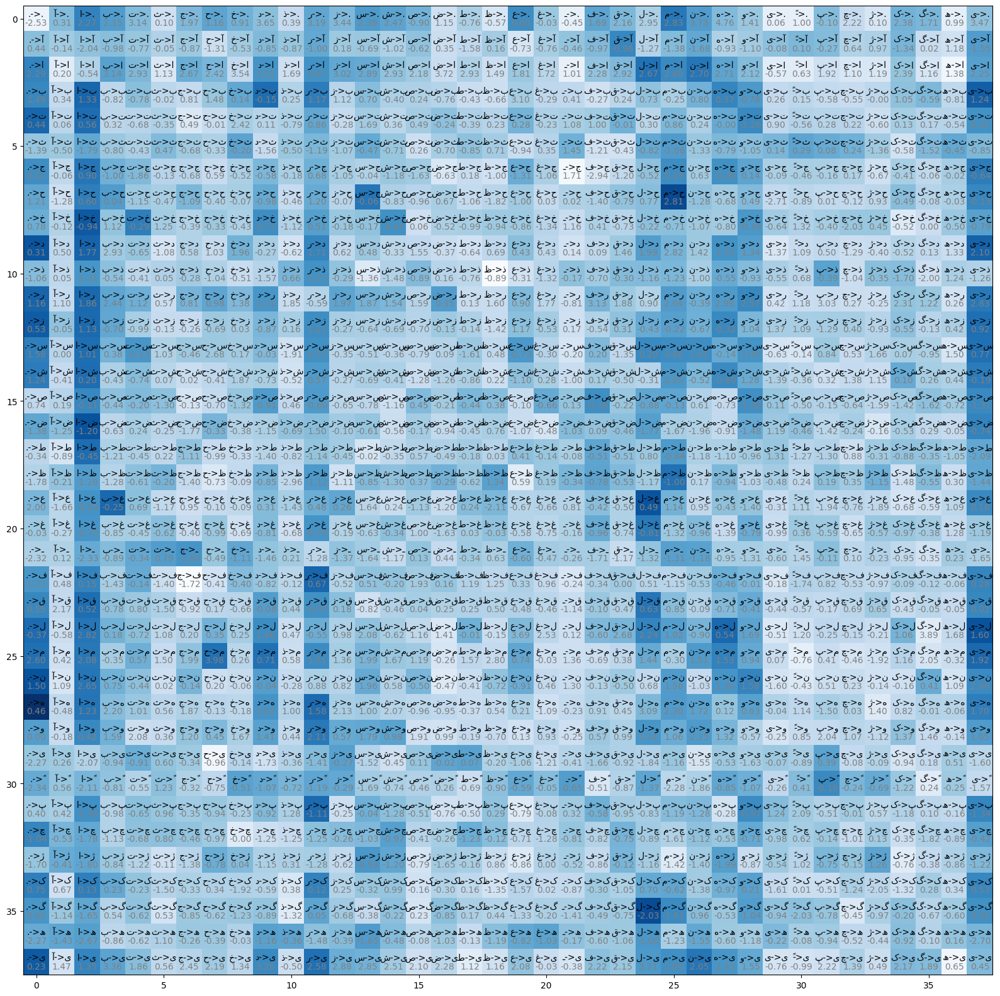

In [102]:
plt.figure(figsize=(20,20),  )
plt.imshow(W.cpu().detach().numpy(), cmap = "Blues")
for i in range(38):
    for j in range(38):
        chstr = itos[i] + '->' + itos[j]
        plt.text(i, j, chstr, ha="center", va="bottom", color='black')
        #print("A")
        plt.text(i, j, f'{ W[i, j].item():0.2f}', ha="center", va="top", color='gray')



In [105]:

for i in range(10):
    name = []
    ix = 0
    while True:
        xenc = F.one_hot(torch.tensor([ix]), num_classes = 38).float()
        logitx = xenc @ W
        counts = logitx.exp()
        p = counts / counts.sum(1, keepdim = True)
        ix = torch.multinomial(p, replacement= True, generator= g, num_samples = 1).item()
        name.append(itos[ix])
        if ix == 0:
            break
    print(name)

['گ', '.']
['ن', '.']
['ش', 'ا', 'ن', 'س', 'ت', '.']
['م', 'ن', '.']
['ف', 'ر', '.']
['م', 'ح', 'م', 'د', '.']
['و', 'ر', 'ج', 'ج', 'ا', 'ت', 'ر', '.']
['ا', 'ر', '.']
['ن', 'و', 'ف', '.']
['ا', 'ه', 'ع', 'ب', 'د', 'ه', '.']


tensor([     0,      1,      2,  ..., 133327, 133328, 133329])